# Imports

In [1]:
# %matplotlib notebook
%pip install numpy seaborn matplotlib pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.manifold import TSNE

from sklearn.neighbors import LocalOutlierFactor as LOF
from sklearn.ensemble import IsolationForest as IF
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, silhouette_score

from sklearn.cluster import KMeans, AgglomerativeClustering, HDBSCAN
from sklearn.mixture import GaussianMixture


https://www.kaggle.com/datasets/ghoshsaibal/creditcard

# Analiza

## Ucitavanje podataka

In [3]:
def csv_to_pd(path):
    return pd.read_csv(path)

def pandas_uniques(df, col_name):
    counts = df[col_name].value_counts()
    unique = df[col_name].unique()
    return unique,counts

def print_uniques(df, cols, count_per_categ=False):
    for c in cols:
        print()
        print(c)
        print("-----------------")
        u, b = pandas_uniques(df,c)
        print("\tVrednosti: ",u)
        print("\tBroj jedinstvenih: ",len(u))
    
        if not count_per_categ: continue
        print("\tJedinstvenih:")
        for i in range(len(b)):
            print("\t",b.iloc[i])
applications = csv_to_pd("./data/application_record.csv")
credits = csv_to_pd("./data/credit_record.csv")

In [4]:
applications.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [5]:
cols = ['CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',\
        'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE']
print_uniques(applications,cols)


CODE_GENDER
-----------------
	Vrednosti:  ['M' 'F']
	Broj jedinstvenih:  2

FLAG_OWN_CAR
-----------------
	Vrednosti:  ['Y' 'N']
	Broj jedinstvenih:  2

FLAG_OWN_REALTY
-----------------
	Vrednosti:  ['Y' 'N']
	Broj jedinstvenih:  2

NAME_INCOME_TYPE
-----------------
	Vrednosti:  ['Working' 'Commercial associate' 'Pensioner' 'State servant' 'Student']
	Broj jedinstvenih:  5

NAME_EDUCATION_TYPE
-----------------
	Vrednosti:  ['Higher education' 'Secondary / secondary special' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
	Broj jedinstvenih:  5

NAME_FAMILY_STATUS
-----------------
	Vrednosti:  ['Civil marriage' 'Married' 'Single / not married' 'Separated' 'Widow']
	Broj jedinstvenih:  5

NAME_HOUSING_TYPE
-----------------
	Vrednosti:  ['Rented apartment' 'House / apartment' 'Municipal apartment'
 'With parents' 'Co-op apartment' 'Office apartment']
	Broj jedinstvenih:  6

OCCUPATION_TYPE
-----------------
	Vrednosti:  [nan 'Security staff' 'Sales staff' 'Accountants' '

In [6]:
credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [7]:
cols = ['STATUS']
print_uniques(credits,cols)


STATUS
-----------------
	Vrednosti:  ['X' '0' 'C' '1' '2' '3' '4' '5']
	Broj jedinstvenih:  8


In [8]:
credits

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C
...,...,...,...
1048570,5150487,-25,C
1048571,5150487,-26,C
1048572,5150487,-27,C
1048573,5150487,-28,C


## Enkodiranje

In [9]:
def encode_column(df, col_spec):
    df_enc = df.copy()
    for (c, is_one_hot) in col_spec:
        if is_one_hot:
            df_enc = pd.get_dummies(df_enc, columns=[c], dtype=int)
            continue
        le = LabelEncoder()
        le.fit(df_enc[c])
        df_enc[c] = le.transform(df_enc[c])
    return df_enc

def encode_with_dict(df, col, enc_dict):
    df_enc = df.copy()
    df_enc[col] = df_enc[col].apply(lambda x: enc_dict[x])
    return df_enc

In [10]:
cols = [('CODE_GENDER',False),\
        ('FLAG_OWN_CAR',False),\
        ('FLAG_OWN_REALTY',False),\
        ('NAME_INCOME_TYPE',True),\
        ('NAME_EDUCATION_TYPE',True),\
        ('NAME_FAMILY_STATUS', True),\
        ('NAME_HOUSING_TYPE',True),\
        ('OCCUPATION_TYPE',True)]
applications = encode_column(applications, cols)

enc_dict = {'X':-2, 'C':-1, '0':0, '1':1, '2':2, '3':3, '4':4, '5':5}
cred_enc = encode_with_dict(credits, 'STATUS', enc_dict)

## Feature Engineering

In [11]:
# Podelimo zaradu u grupe 
# 20 - 260k na po 20k, sve preko je jedna grupa
def get_bucket(number, bucket_size, max_value, red_one):
    number = min(number,max_value)
    s = number//bucket_size
    return s - 1 if red_one else s

In [12]:
# Dane od rodjenja, dane zaposljenja prevedemo u godine
applications['DAYS_OLD'] = -applications['DAYS_BIRTH']
applications['DAYS_WORKING'] = applications['DAYS_EMPLOYED'].apply(lambda x: -x if x<0 else 0)
applications['INCOME_BRACKET'] = applications['AMT_INCOME_TOTAL'].apply(lambda x: get_bucket(x,20000,1000000,False))

In [13]:
applications.drop(['DAYS_BIRTH','DAYS_EMPLOYED','AMT_INCOME_TOTAL'],axis=1, inplace=True)

In [14]:
applications.describe()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,DAYS_OLD,DAYS_WORKING,INCOME_BRACKET
count,4.385570e+05,438557.000000,438557.000000,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,438557.000000,...,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.328616,0.371897,0.693351,0.427390,1.0,0.206133,0.287771,0.108207,2.194465,...,0.030828,0.007880,0.002374,0.093712,0.004661,0.018226,0.003797,15997.904649,2172.502516,8.881479
std,5.716370e+05,0.469711,0.483312,0.461103,0.724882,0.0,0.404527,0.452724,0.310642,0.897207,...,0.172853,0.088421,0.048663,0.291428,0.068110,0.133767,0.061499,4185.030007,2397.398738,5.013303
min,5.008804e+06,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7489.000000,0.000000,1.000000
25%,5.609375e+06,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12514.000000,371.000000,6.000000
50%,6.047745e+06,0.000000,0.000000,1.000000,0.000000,1.0,0.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15630.000000,1467.000000,8.000000
75%,6.456971e+06,1.000000,1.000000,1.000000,1.000000,1.0,0.000000,1.000000,0.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19483.000000,3103.000000,11.000000
max,7.999952e+06,1.000000,1.000000,1.000000,19.000000,1.0,1.000000,1.000000,1.000000,20.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,25201.000000,17531.000000,50.000000


In [15]:
payment_history = cred_enc[cred_enc['ID'].isin(applications['ID'])]
ids = list(payment_history.groupby('ID').apply(lambda x: sorted(zip(x['MONTHS_BALANCE'], x['STATUS']),reverse=True)[0][1]).to_dict().keys())
applications = applications[applications['ID'].isin(ids)]


## Outlieri

In [16]:
def plot_outliers_cols(data, col1, col2, outliers):
    color_map = {1: 'blue', -1: 'red'}
    colors = [color_map[i] for i in outliers]

    plt.scatter(data[col1], data[col2], c=colors, alpha=0.1)

    plt.xlabel(col1)
    plt.ylabel(col2)

    plt.show()

def plot_outliers(X, y, outliers):
    color_map = {1: 'blue', -1: 'red'}
    colors = [color_map[i] for i in outliers]

    plt.scatter(X, y, c=colors, alpha=0.1)

    plt.show()

### Isolation Forest

In [17]:
isf = IF(n_estimators=1000, n_jobs=-1, contamination=0.1)
pred1 = isf.fit_predict(applications)
c = (pred1<0).sum()
print("Outliers: ",c)

Outliers:  3645


In [18]:
ind = []
for i in range(len(pred1)):
    if pred1[i] == -1:
        ind.append(i)
outliers = applications.iloc[ind]
outliers.describe()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,DAYS_OLD,DAYS_WORKING,INCOME_BRACKET
count,3.645000e+03,3645.000000,3645.00000,3645.000000,3645.000000,3645.0,3645.000000,3645.000000,3645.000000,3645.000000,...,3645.000000,3645.000000,3645.0,3645.000000,3645.000000,3645.000000,3645.000000,3645.000000,3645.000000,3645.000000
mean,5.080087e+06,0.420027,0.46749,0.413169,0.587654,1.0,0.409328,0.421948,0.205487,2.138272,...,0.048560,0.009877,0.0,0.115501,0.008505,0.018930,0.005761,13778.052401,2416.490261,10.658436
std,4.389619e+04,0.493631,0.49901,0.492470,0.921038,0.0,0.491777,0.493938,0.404112,1.158455,...,0.214975,0.098902,0.0,0.319669,0.091841,0.136297,0.075695,3735.038555,2337.740666,6.840021
min,5.008804e+06,0.000000,0.00000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,7489.000000,0.000000,1.000000
25%,5.041473e+06,0.000000,0.00000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,10668.000000,718.000000,6.000000
50%,5.089121e+06,0.000000,0.00000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,13166.000000,1680.000000,9.000000
75%,5.117325e+06,1.000000,1.00000,1.000000,1.000000,1.0,1.000000,1.000000,0.000000,3.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,16184.000000,3234.000000,13.000000
max,5.150395e+06,1.000000,1.00000,1.000000,14.000000,1.0,1.000000,1.000000,1.000000,15.000000,...,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,24611.000000,14127.000000,50.000000


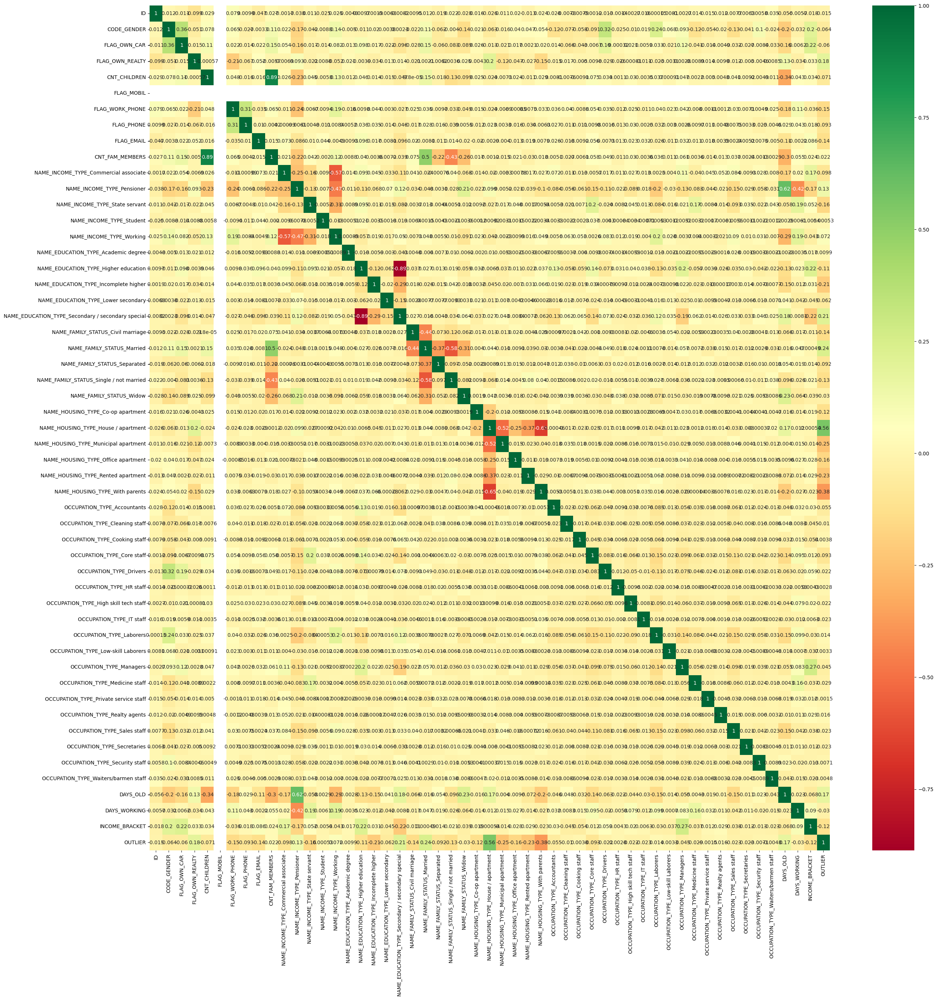

In [19]:
data = applications.copy()
data['OUTLIER'] = pred1
plt.figure(figsize=(30,30))
g=sns.heatmap(data.corr(),annot=True,cmap="RdYlGn")

In [20]:
c = data.corr()
c = abs(c['OUTLIER']).sort_values(ascending=False).drop(['OUTLIER','FLAG_MOBIL'])[:8]

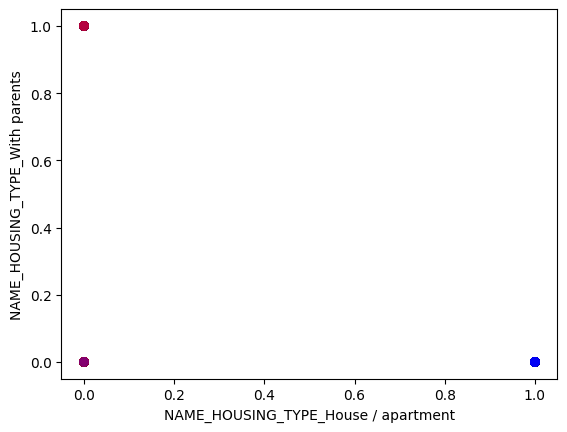

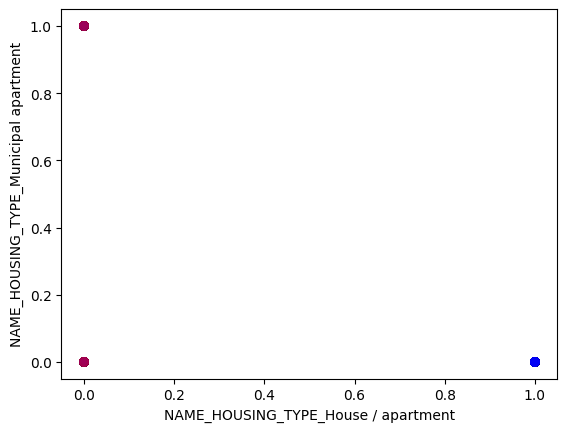

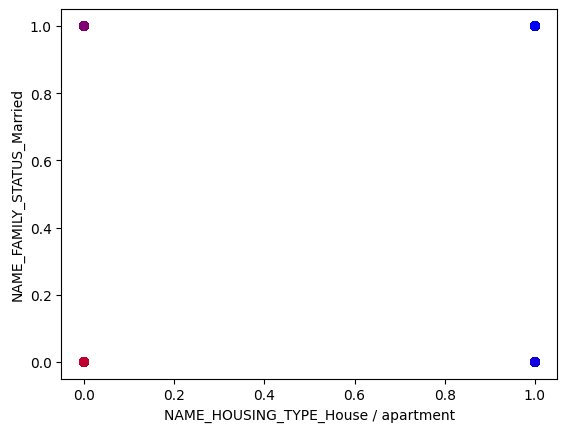

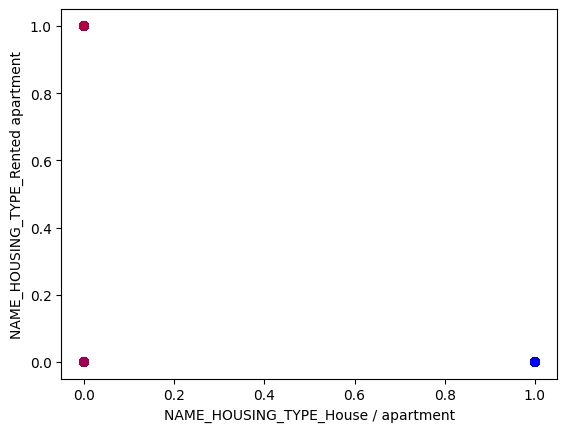

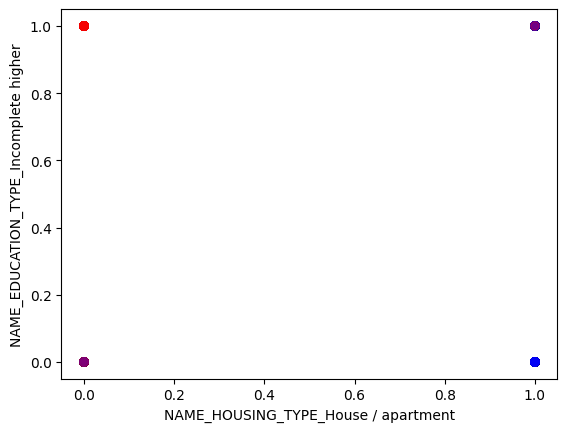

...

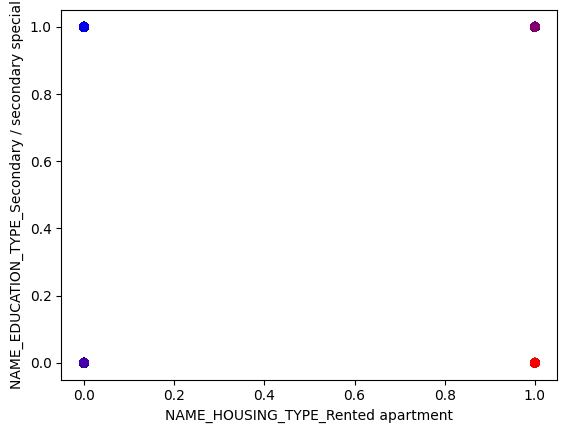

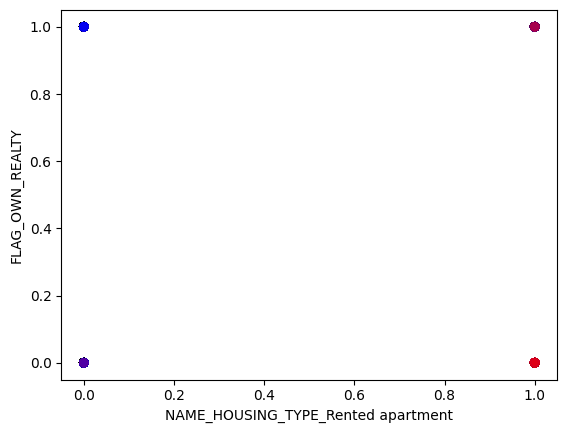

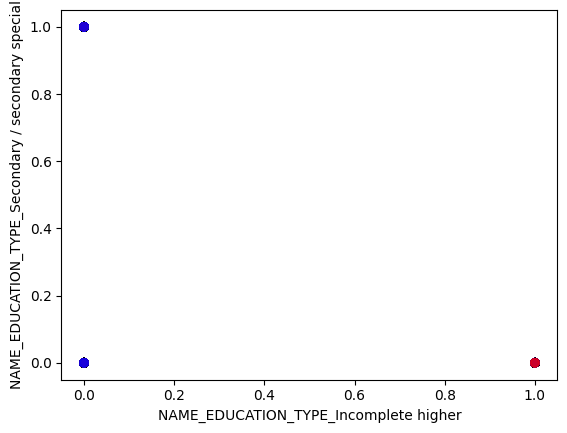

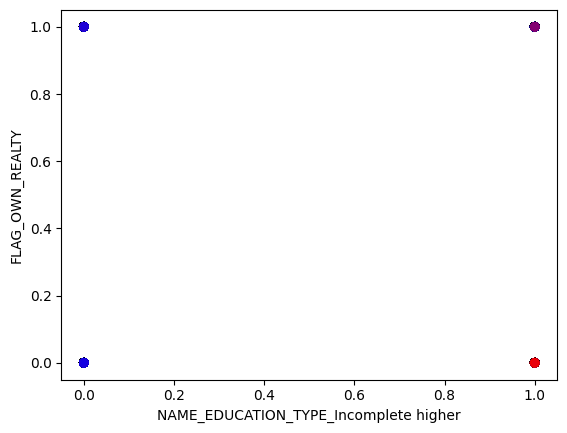

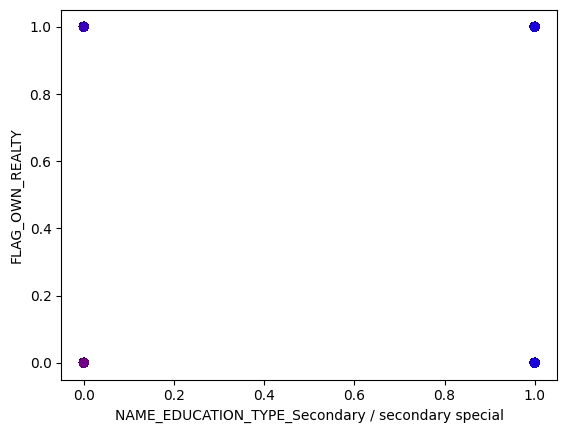

In [21]:
c_names = c.index.to_list()
for i in range(len(c_names)):
    for j in range(i+1,len(c_names)):
        plot_outliers_cols(data = applications, col1 = c_names[i], col2 = c_names[j], outliers = pred1)

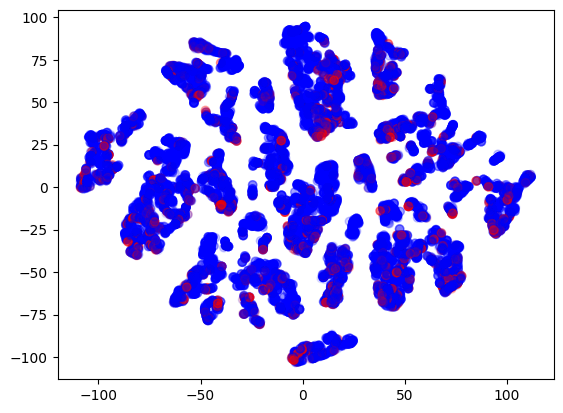

In [22]:
perplexities = [100] #[2,5,30,50,100]
for p in perplexities:
    tsne = TSNE(n_components=2, n_jobs=-1, perplexity=p)
    tsne_res = tsne.fit_transform(applications)
    tsne_res
    r_T = np.transpose(tsne_res)
    plot_outliers(r_T[0],r_T[1],pred1)

### Local Outlier Factor

In [23]:
lof = LOF(n_neighbors=30, n_jobs=-1)
pred2 = lof.fit_predict(applications)
c = (pred2<0).sum()
print("Outliers: ",c)

Outliers:  998


In [24]:
ind = []
for i in range(len(pred2)):
    if pred2[i] == -1:
        ind.append(i)
outliers = applications.iloc[ind]
outliers.describe()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,DAYS_OLD,DAYS_WORKING,INCOME_BRACKET
count,9.980000e+02,998.000000,998.000000,998.000000,998.000000,998.0,998.000000,998.000000,998.000000,998.000000,...,998.000000,998.000000,998.0,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000
mean,5.075809e+06,0.348697,0.343687,0.741483,0.256513,1.0,0.199399,0.271543,0.074148,2.027054,...,0.013026,0.016032,0.0,0.118236,0.018036,0.043086,0.002004,18155.267535,2761.693387,9.527054
std,4.479198e+04,0.476797,0.475176,0.438039,0.632085,0.0,0.399749,0.444978,0.262143,0.811323,...,0.113443,0.125662,0.0,0.323050,0.133149,0.203153,0.044744,5038.966974,3150.135756,6.818375
min,5.008806e+06,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,7489.000000,0.000000,1.000000
25%,5.041261e+06,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,13648.000000,473.000000,6.000000
50%,5.065643e+06,0.000000,0.000000,1.000000,0.000000,1.0,0.000000,0.000000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,19961.000000,1812.000000,8.000000
75%,5.116099e+06,1.000000,1.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,22631.250000,3760.000000,11.000000
max,5.150479e+06,1.000000,1.000000,1.000000,4.000000,1.0,1.000000,1.000000,1.000000,6.000000,...,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,25099.000000,15661.000000,49.000000


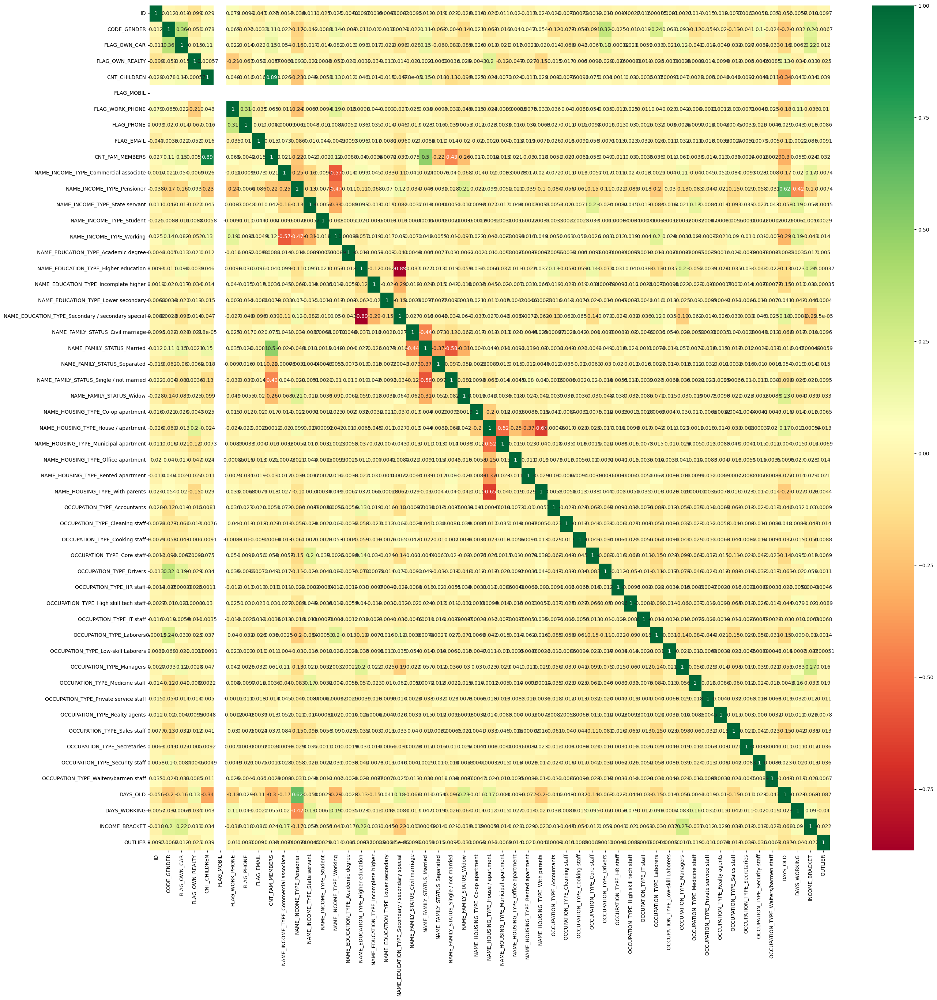

In [25]:
data = applications.copy()
data['OUTLIER'] = pred2
plt.figure(figsize=(30,30))
g=sns.heatmap(data.corr(),annot=True,cmap="RdYlGn")

In [26]:
c = data.corr()
c = abs(c['OUTLIER']).sort_values(ascending=False).drop(['OUTLIER','FLAG_MOBIL'])[:8]

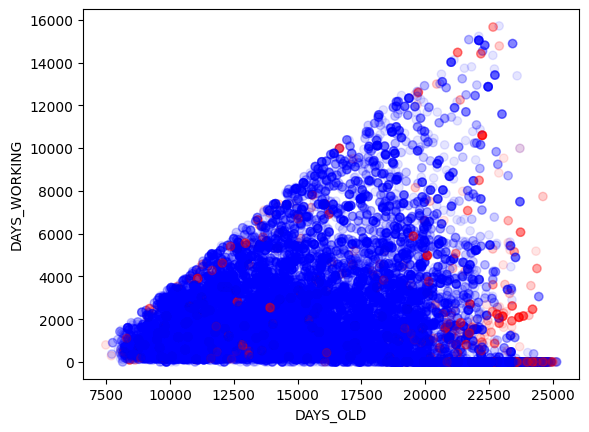

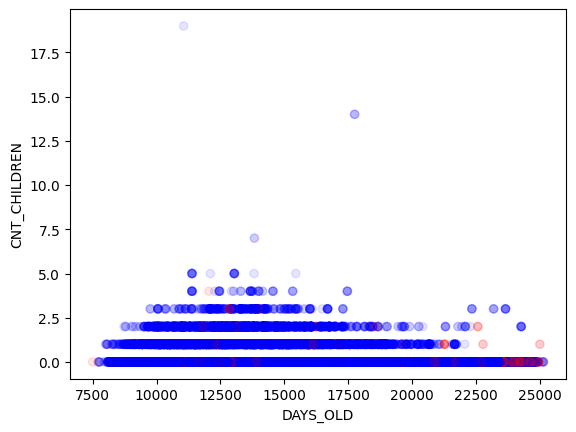

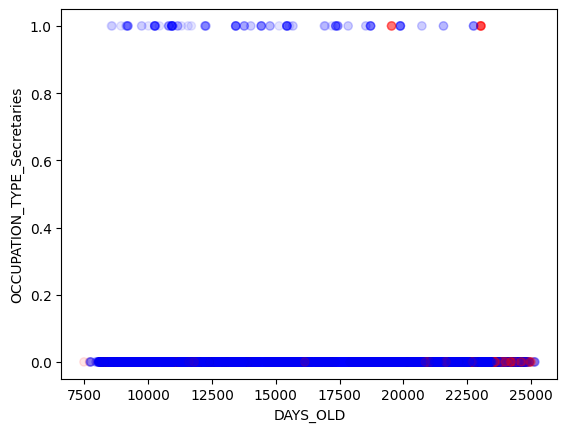

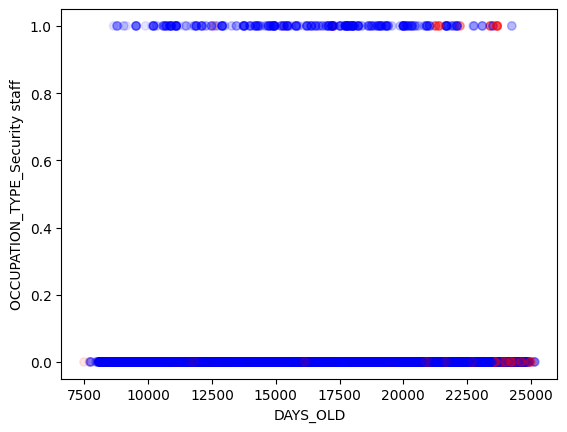

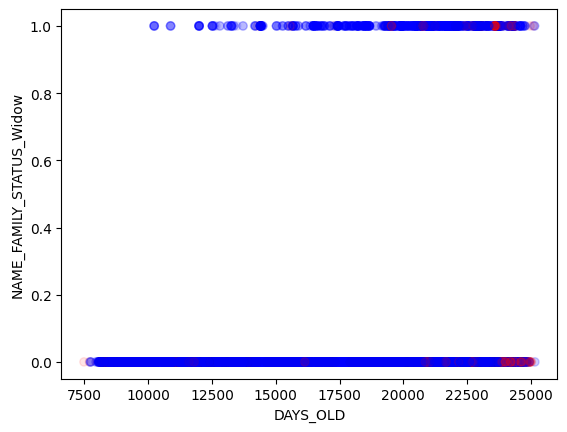

...

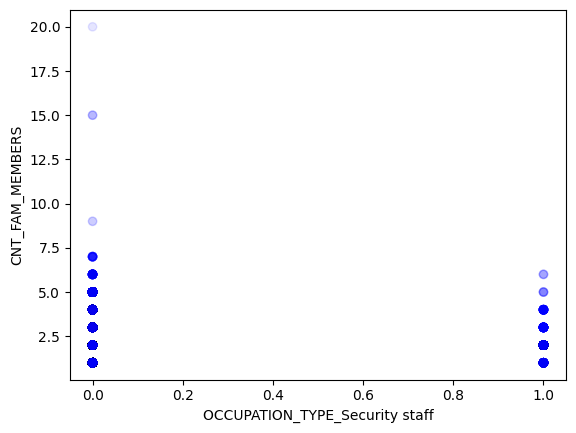

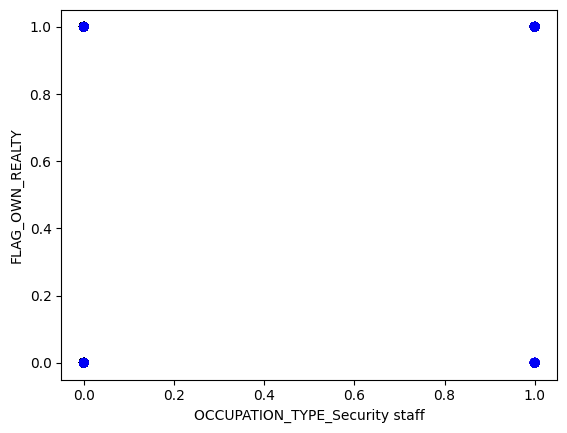

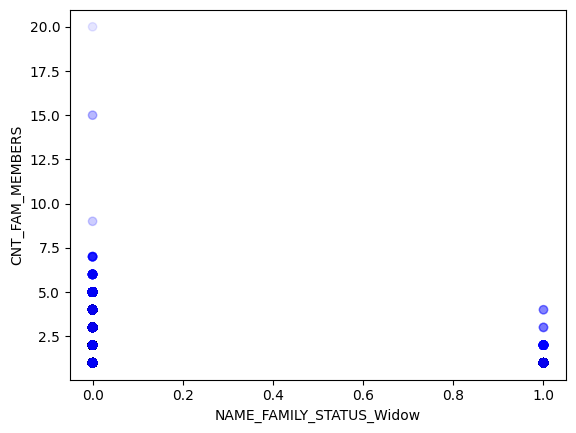

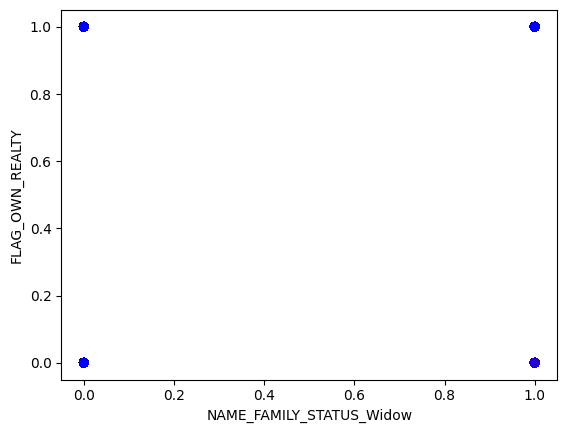

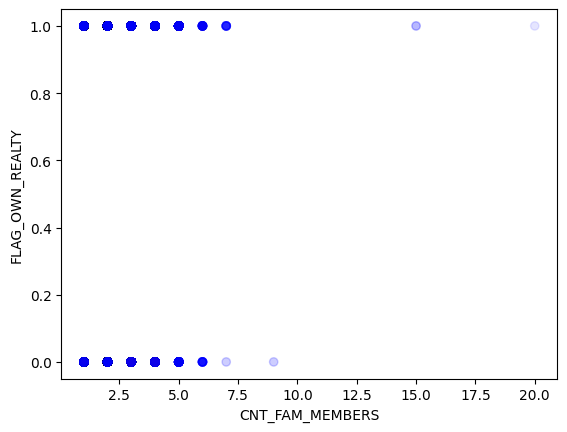

In [27]:
c_names = c.index.to_list()
for i in range(len(c_names)):
    for j in range(i+1,len(c_names)):
        plot_outliers_cols(applications, c_names[i], c_names[j], pred2)

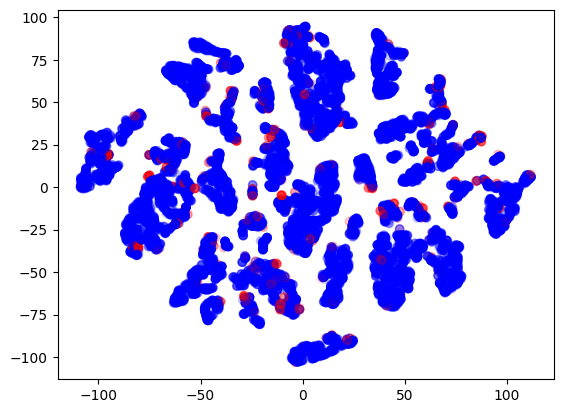

In [28]:
perplexities = [100] #[2,5,30,50,100]
for p in perplexities:
    tsne = TSNE(n_components=2, n_jobs=-1, perplexity=p)
    tsne_res = tsne.fit_transform(applications)
    tsne_res
    r_T = np.transpose(tsne_res)
    plot_outliers(r_T[0],r_T[1],pred2)

In [29]:
outliers=[]
for i in range(len(pred2)):
    if pred2[i]==-1:
        outliers.append(applications.index[i])
print("Outliers: ", len(outliers))
applications.drop(outliers, inplace=True)
applications

Outliers:  998


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,DAYS_OLD,DAYS_WORKING,INCOME_BRACKET
0,5008804,1,1,1,0,1,1,0,0,2.0,...,0,0,0,0,0,0,0,12005,4542,21.0
1,5008805,1,1,1,0,1,1,0,0,2.0,...,0,0,0,0,0,0,0,12005,4542,21.0
3,5008808,0,0,1,0,1,0,1,1,1.0,...,0,0,0,1,0,0,0,19110,3051,13.0
4,5008809,0,0,1,0,1,0,1,1,1.0,...,0,0,0,1,0,0,0,19110,3051,13.0
5,5008810,0,0,1,0,1,0,1,1,1.0,...,0,0,0,1,0,0,0,19110,3051,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434808,5149828,1,1,1,0,1,0,0,0,2.0,...,0,0,0,0,0,0,0,17348,2420,15.0
434809,5149834,0,0,1,0,1,0,1,1,2.0,...,1,0,0,0,0,0,0,12387,1325,7.0
434810,5149838,0,0,1,0,1,0,1,1,2.0,...,1,0,0,0,0,0,0,12387,1325,7.0
434811,5150049,0,0,1,0,1,0,0,0,2.0,...,0,0,0,1,0,0,0,17958,655,14.0


## Prikaz

In [30]:
def plot_sub(data, axes, i, j, binwidth, color,title=None):
    m = np.mean(data)
    v = np.var(data)
    ax = get_ax(axes,i,j)

    sns.histplot(data = data, binwidth = binwidth, ax = ax, color=color, legend=False)
    
    ax.axvline(m, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {m:.2f}')
    ax.axvline(m - np.sqrt(v), color='green', linestyle='dashed', linewidth=2, label=f'-1 SD')
    ax.axvline(m + np.sqrt(v), color='green', linestyle='dashed', linewidth=2, label=f'+1 SD')

    if not title is None:
        ax.set_title(title)

def plot_pie(data, ax,col):
    labels = data.unique()
    counts = data.value_counts()
    ax.pie(counts,labels=labels,autopct='%1.1f%%')
    ax.set_title(col)

def get_ax(axes, i, j):
    if not hasattr(axes,'shape'):
        return axes
    elif len(axes.shape) == 1:
        return axes[i]
    else:
        return axes[i,j]
    
def get_plot_w_h(plot_count):
    w = int(plot_count**0.5)
    h = plot_count //w
    if plot_count%w !=0:
        h+=1
    return w,h

def plot_features(X, col_list, plot_w, plot_h):
    #col_list - kolona, sirina binova, boja
    plot_count = len(col_list)
    w,h = get_plot_w_h(plot_count)
    fig, axes = plt.subplots(h, w, figsize = (plot_h,plot_w))
    
    for i in range(h):
        for j in range(w):
            ind = i*w + j
            if ind >= plot_count:
                break
            col, bins, color = col_list[ind]
            plot_sub(X[col], axes, i, j, bins, color)
    plt.tight_layout()
    plt.show()

def plot_pie_charts(X, col_list, plot_w, plot_h):
    plot_count = len(col_list)
    w,h = get_plot_w_h(plot_count)
    fig, axes = plt.subplots(h, w, figsize = (plot_h,plot_w))
    
    for i in range(h):
        for j in range(w):
            ind = i*w + j
            if ind >= plot_count:
                break
            col = col_list[ind]
            plot_pie(X[col], get_ax(axes, i, j),col)
    plt.tight_layout()
    plt.show()

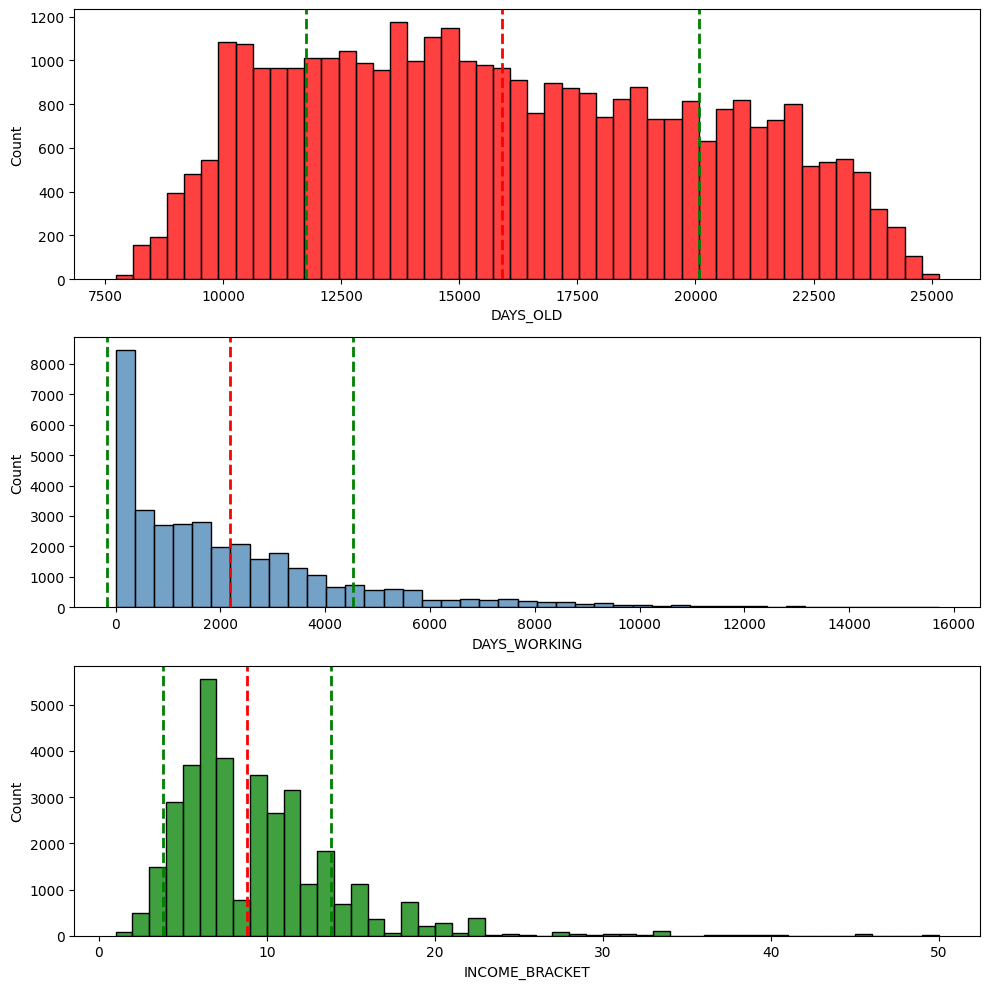

In [31]:
col_list = [('DAYS_OLD',365,'red'),\
            ('DAYS_WORKING',365,'steelblue'),\
            ('INCOME_BRACKET',1,'green')]
plot_features(applications,col_list,10,10)

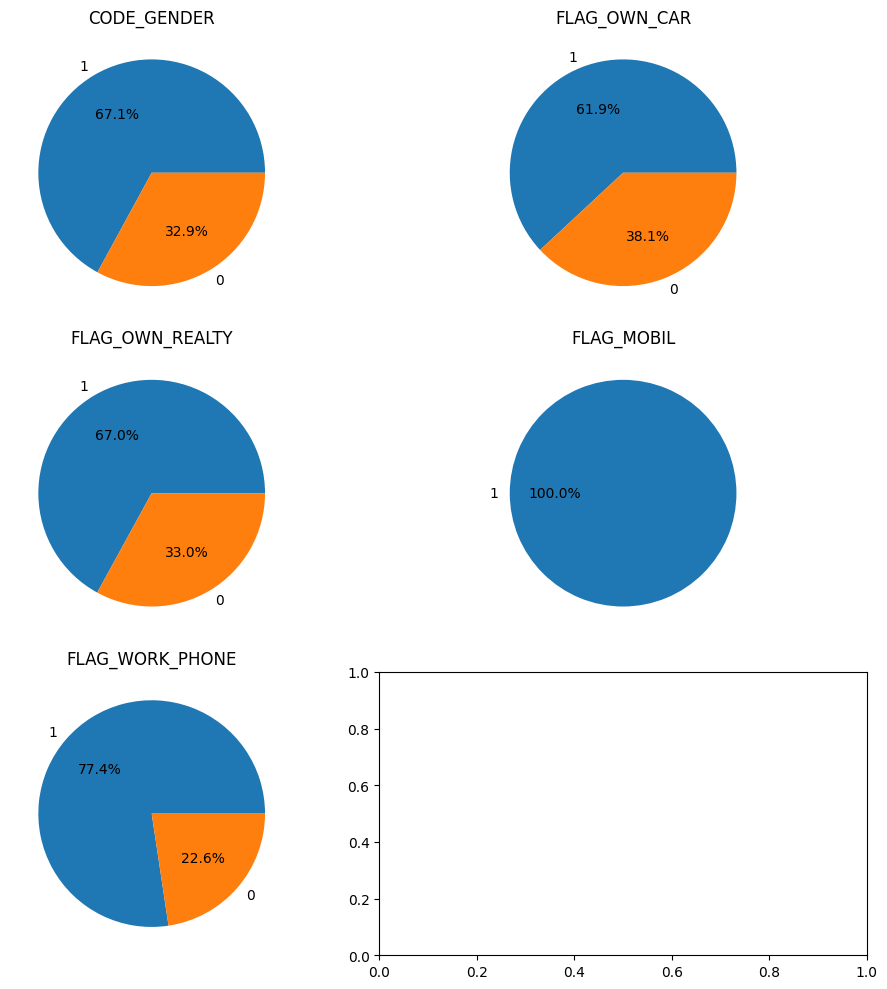

In [32]:
col_list = ['CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_MOBIL','FLAG_WORK_PHONE']
plot_pie_charts(applications,col_list,10,10)

# Odredjivanje grupe korisnika

In [33]:
# #Nadjemo istoriju placanje za one korisnike ciji ID je u obe tabele
# payment_history = cred_enc[cred_enc['ID'].isin(applications['ID'])]
# #Za svakog korisnika nadjemo status otplate za svaki od meseca, sortiramo i uzmemo samo najnovije podatke
# last_pay_dict = payment_history.groupby('ID').apply(lambda x: sorted(zip(x['MONTHS_BALANCE'], x['STATUS']),reverse=True)[0][1]).to_dict()
# avg_pay_dict = payment_history.groupby('ID').apply(lambda x: sorted(zip(x['MONTHS_BALANCE'], x['STATUS']),reverse=True)).to_dict()

In [34]:
# def get_avg_pay(pay_dict):
#     for i in pay_dict.keys():
#         l = pay_dict[i]
#         tot_w = 0
#         s = 0
#         for j in range(len(l)):
#             w = 1/(j+1)
#             s += w * l[j][1]
#             tot_w += w
#         pay_dict[i] = int(s / tot_w)
#     return pay_dict
# avg = list(get_avg_pay(avg_pay_dict).values())
# last = list(last_pay_dict.values())

In [35]:
# ids = list(last_pay_dict.keys())

In [36]:
# apps_with_paydata = applications[applications['ID'].isin(ids)]

## Skaliranje

In [37]:
# ss = StandardScaler()
# applications = ss.fit_transform(applications)

# Redukcija dimenzionalnosti

- DimReduction(tip, broj komp ili ne) -> Clustering (HDBSCAN, KMeans, Agllomerative) -> Viz
    - PCA - 0.95 variance
    - LLE - Tuneuj neighbors i components
    - Bez iceg
- Clustering
    - KMeans - silhoutte graph
    - HDBSCAN 
    - Agglomerative
- Viz
    - TSNE 2d

In [38]:
def get_pcas(min_comp, max_comp, step, out):
    i = min_comp
    while i<=max_comp:
        out.append(("PCA "+str(i)+" variance",PCA(n_components=i)))
        i+=step

def get_lles(min_comp, max_comp, step, min_neigh, max_neigh, neigh_step,out):
    for i in range(min_comp,max_comp,step):
        for j in range(min_neigh, max_neigh,step):
            out.append(("LLE "+str(i)+" components, "+str(j)+" neighbors",LocallyLinearEmbedding(n_components=i, n_jobs=-1, n_neighbors=j, eigen_solver='dense')))

def get_ag(min_cluster, max_cluster, step, out):
    for i in range(min_cluster,max_cluster,step):
        out.append(("AG "+str(i)+" clusters",AgglomerativeClustering(n_clusters=i)))

def plot_clusters(X, y, target, title):
    color_map = {0: 'darkblue', 1: 'red', 2: 'green', 3: 'yellow', 4:'skyblue', 5:'darkorchid', 6:'pink', 7:'lime',8:'black',9:'chocolate'}
    #colors = [color_map[i] for i in target]
    plt.title(title)
    plt.scatter(X, y, c=target, alpha=0.1)
    plt.show()

def visualize_tsne_clust(data, targets, title):
    perplexities = [100] #[2,5,30,50,100]
    for p in perplexities:
        tsne = TSNE(n_components=2, n_jobs=-1, perplexity=p)
        tsne_res = tsne.fit_transform(data)
        r_T = np.transpose(tsne_res)
        plot_clusters(r_T[0],r_T[1],targets, title)

def get_hdbscan(out):
    out.append(("HDBSCAN", HDBSCAN()))

def get_kmeans(min_cluster, max_cluster, step, out):
    for i in range(min_cluster,max_cluster,step):
        out.append(("KMeans "+str(i)+" clusters",KMeans(n_clusters=i)))

def plot_dict(x, y):
    plt.plot(x, y)
    plt.show()


## Kmeans

In [39]:
dims = PCA(n_components=0.95)

kmeans = [(x,KMeans(n_clusters=x,random_state=0)) for x in range(3,10,1)]
ag = [(x,AgglomerativeClustering(n_clusters=x)) for x in range(3,10,1)]
hdb = HDBSCAN()

rez_silh = {'km':[],'ag':[],'hdb':[]}

tsne = TSNE(n_components=2, n_jobs=-1, perplexity=p)
tsne_res = tsne.fit_transform(applications)
r_T = np.transpose(tsne_res)

x_vals = [x for x in range(3,10,1)]

KMeans


c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


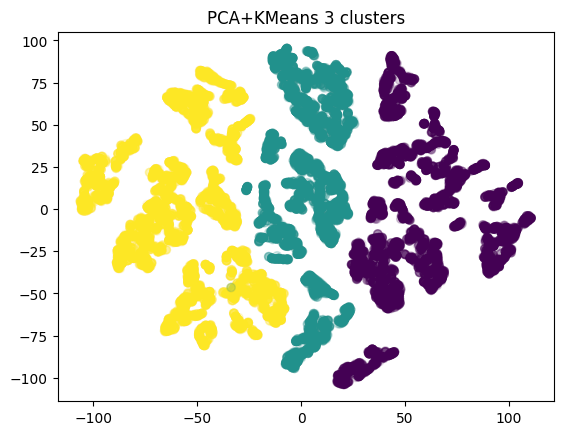

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


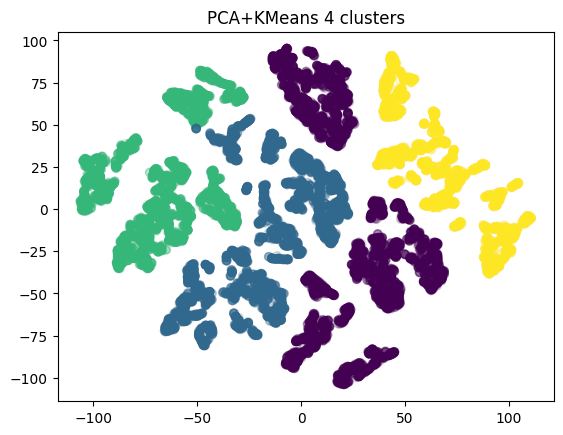

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


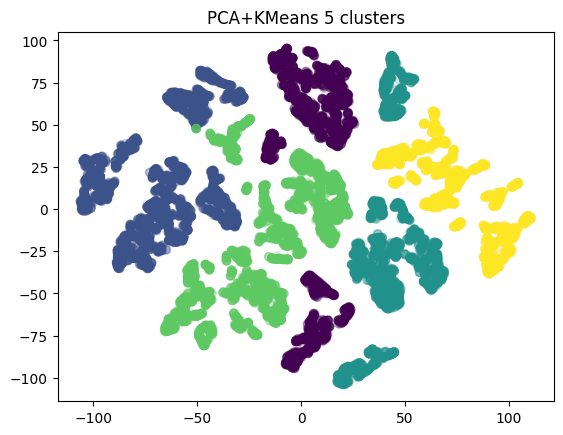

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


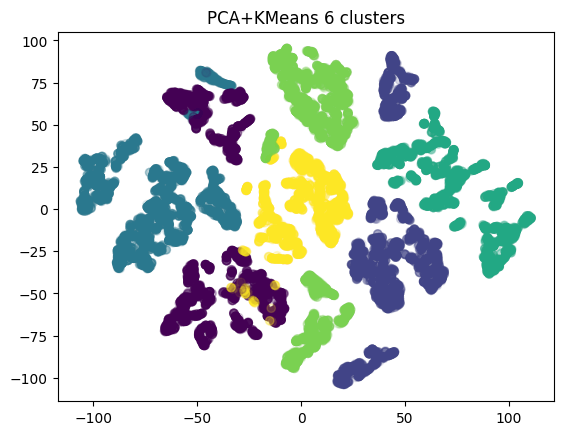

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


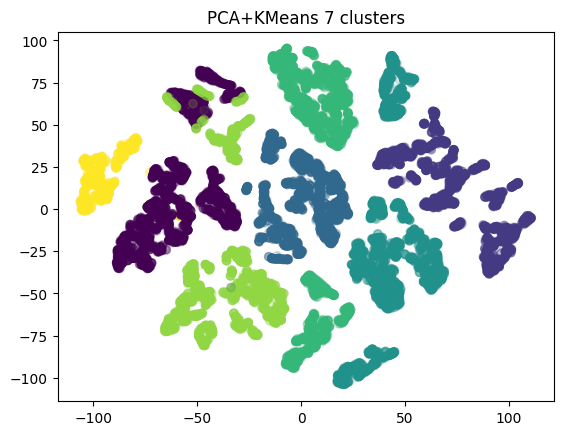

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


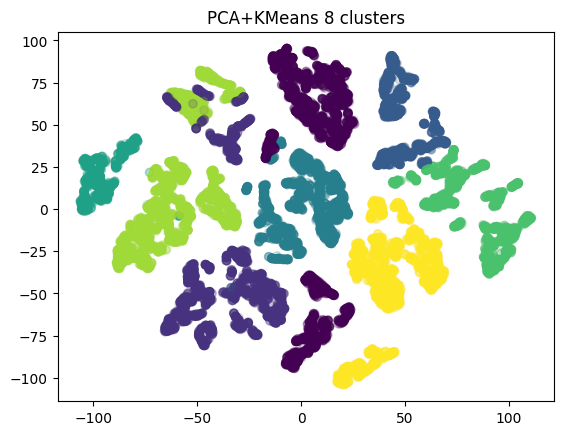

c:\Users\Danilo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


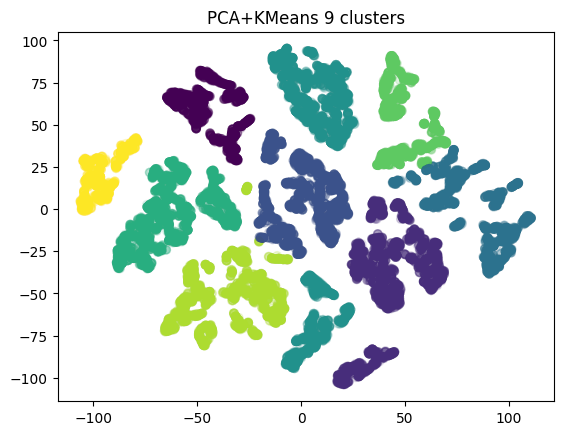

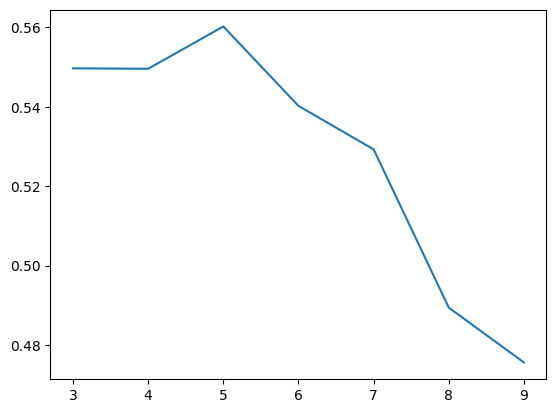

In [41]:
red_data = dims.fit_transform(applications)
rez_silh['km']=[]
rez_km = {}
print("KMeans")
for (i,k) in kmeans:
    clusters = k.fit_predict(red_data)
    if i==5:
        for k in range(5):
            rez_km[k]=[]
        for c in range(len(clusters)):
            rez_km[clusters[c]].append(applications.iloc[c]['ID'])
    rez_silh['km'].append(silhouette_score(applications,clusters))
    plot_clusters(r_T[0],r_T[1],clusters,"PCA+KMeans "+str(i)+" clusters")
plot_dict(x_vals, rez_silh['km'])

In [42]:
id_to_balance = {}
for x in range(len(payment_history)):
    id = payment_history.iloc[x]['ID']
    balance = payment_history.iloc[x]['STATUS']
    if id in id_to_balance.keys():
        id_to_balance[id].append(balance)
    else:
        id_to_balance[id]=[balance]


In [43]:
for i in rez_km.keys():
    for j in range(len(rez_km[i])):
        id = rez_km[i][j]
        rez_km[i][j] = id_to_balance[id]

## Agglomerative clustering

Agglomerative clustering


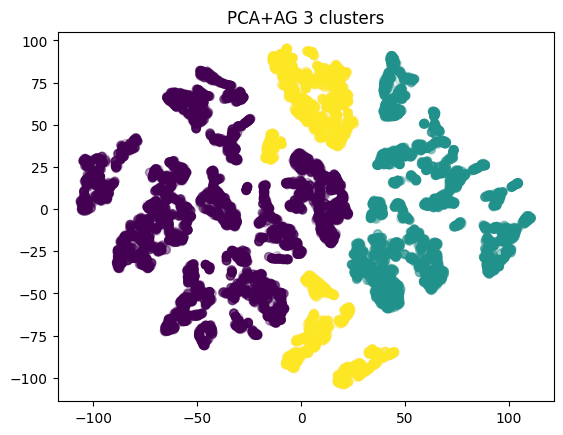

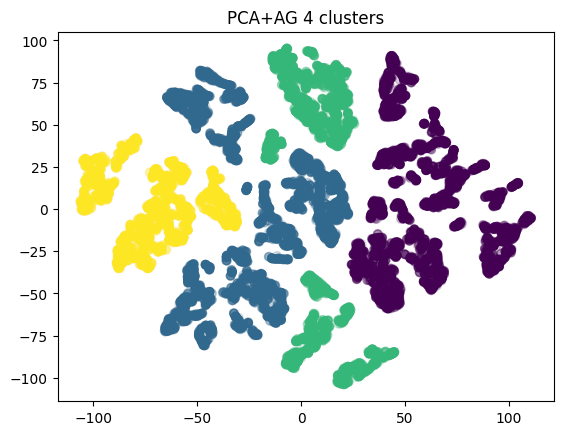

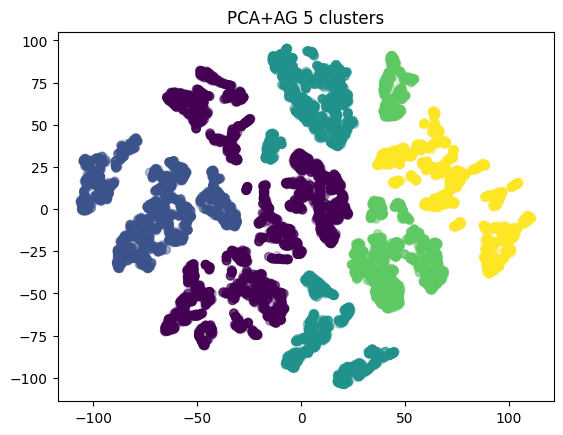

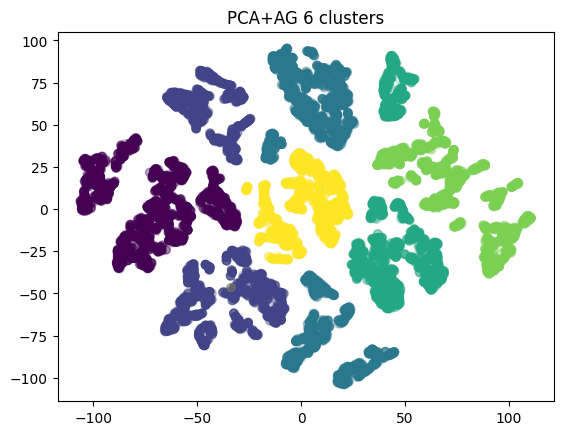

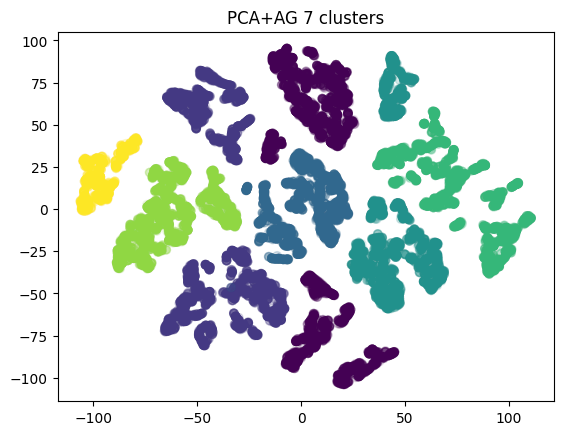

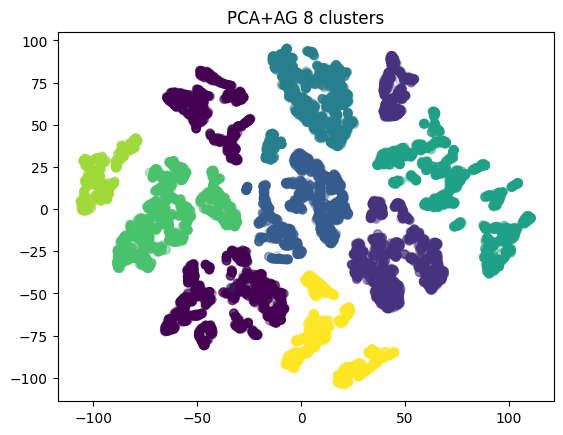

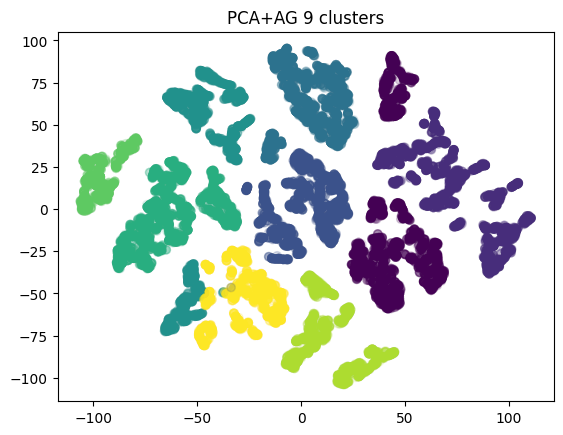

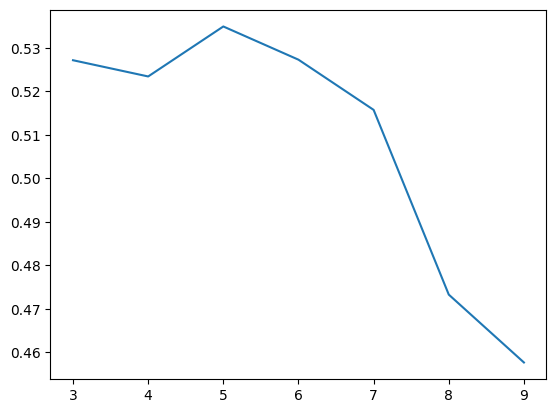

In [44]:
print("Agglomerative clustering")
rez_silh['ag']=[]
rez_ag = {0:[],1:[],2:[],3:[],4:[]}
for (i,k) in ag:
    clusters = k.fit_predict(red_data)
    if i==5:
        for c in range(len(clusters)):
            rez_ag[clusters[c]].append(applications.iloc[c]['ID'])
    rez_silh['ag'].append(silhouette_score(applications,clusters))
    plot_clusters(r_T[0],r_T[1],clusters,"PCA+AG "+str(i)+" clusters")
plot_dict(x_vals, rez_silh['ag'])

#Ubaci i dendogram za AG

In [45]:
for i in rez_ag.keys():
    for j in range(len(rez_ag[i])):
        id = rez_ag[i][j]
        rez_ag[i][j] = id_to_balance[id]

## HDBSCAN

HDBSCAN


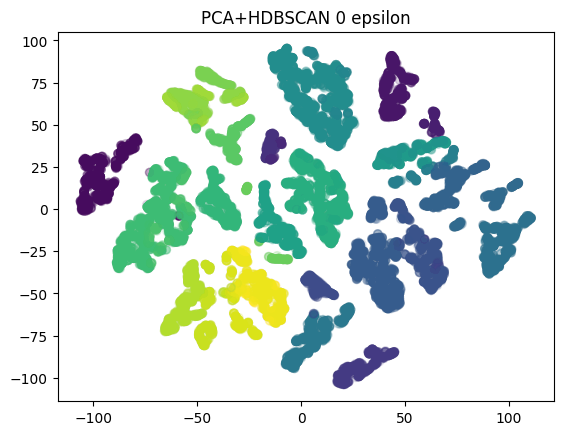

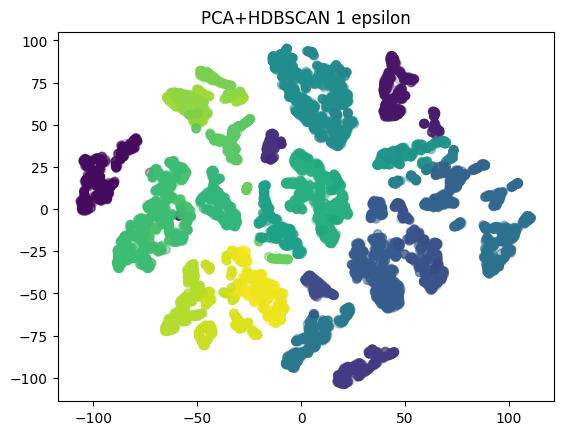

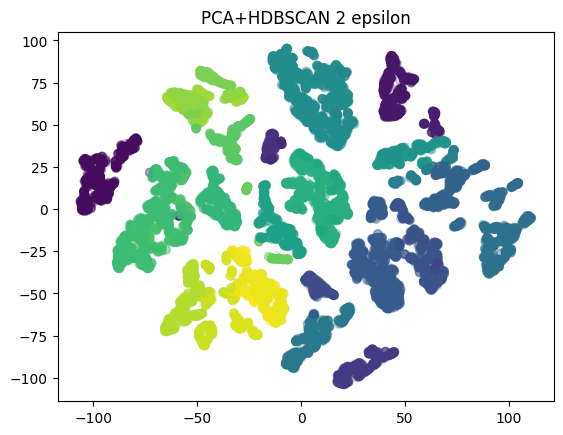

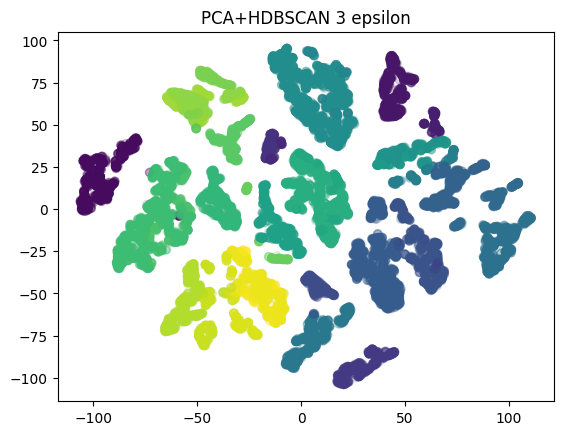

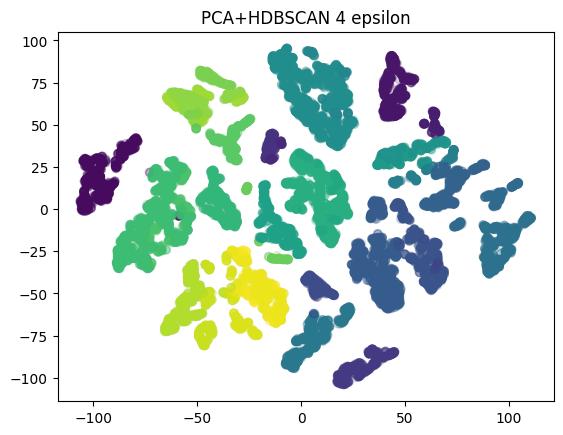

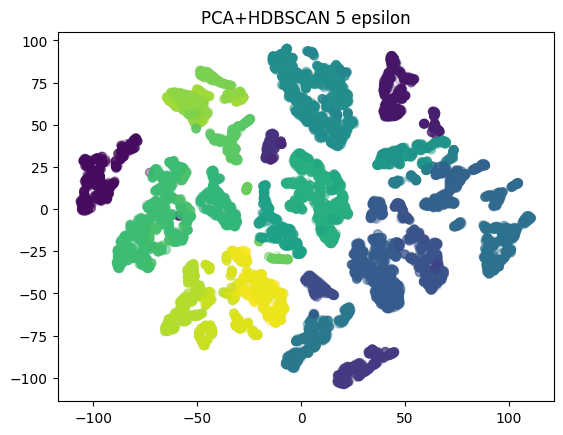

In [46]:
hdb = []
eps = 0

while eps <=5:
    hdb.append((eps,HDBSCAN(cluster_selection_epsilon=eps, min_cluster_size=50)))
    eps+=1

print("HDBSCAN")
for (i,k) in hdb:
    clusters = k.fit_predict(red_data)
    plot_clusters(r_T[0],r_T[1],clusters,"PCA+HDBSCAN "+str(i)+" epsilon")

HDBSCAN
16


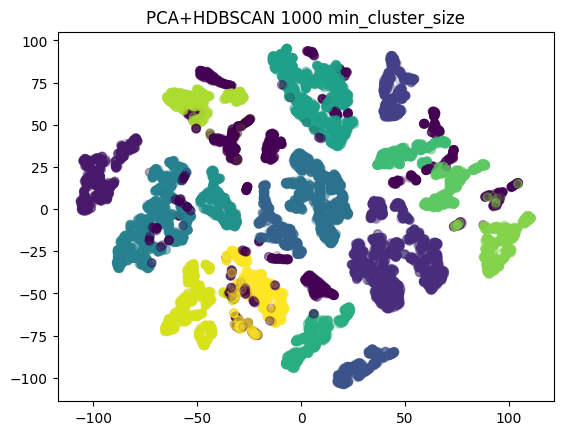

7


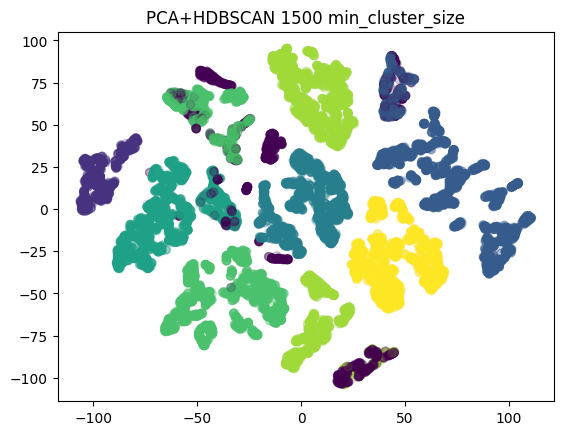

6


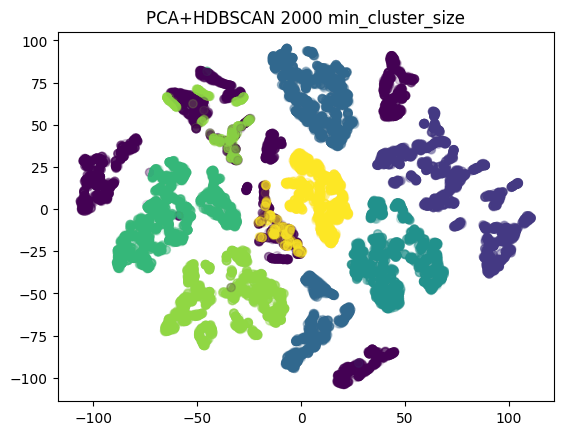

4


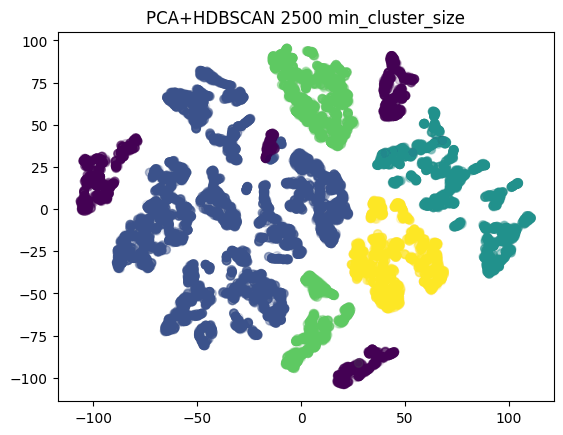

4


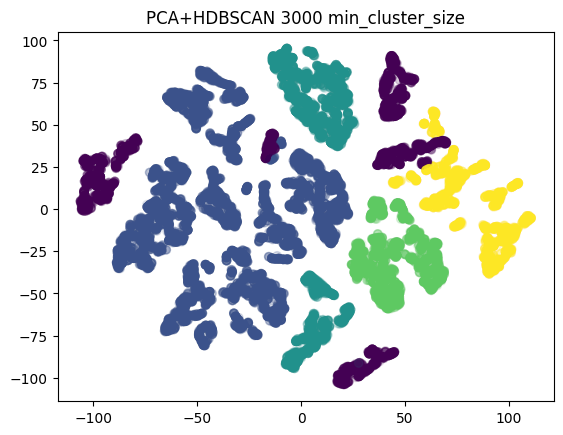

3


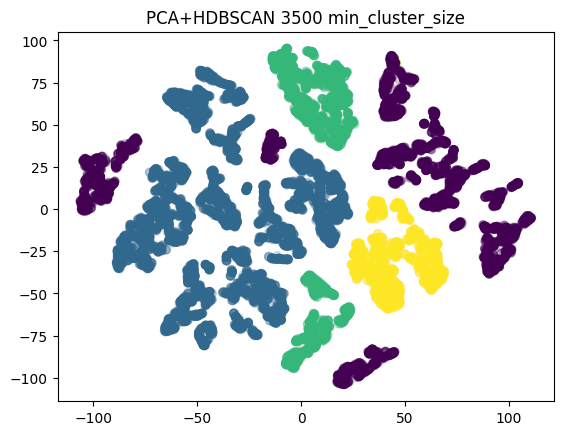

3


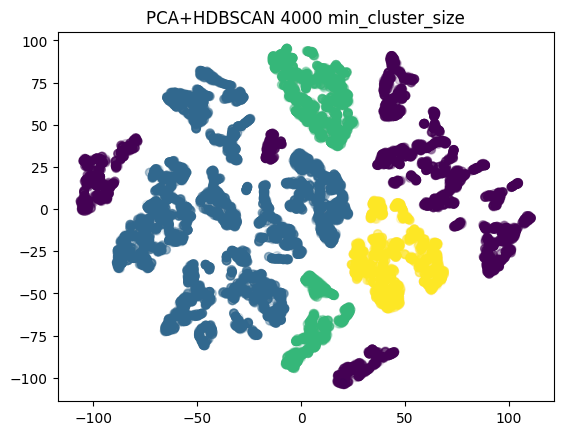

2


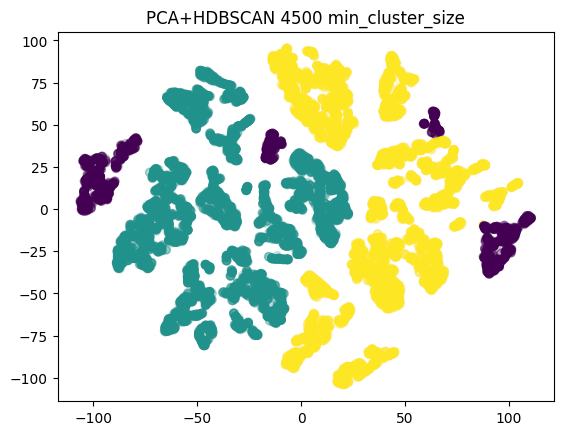

2


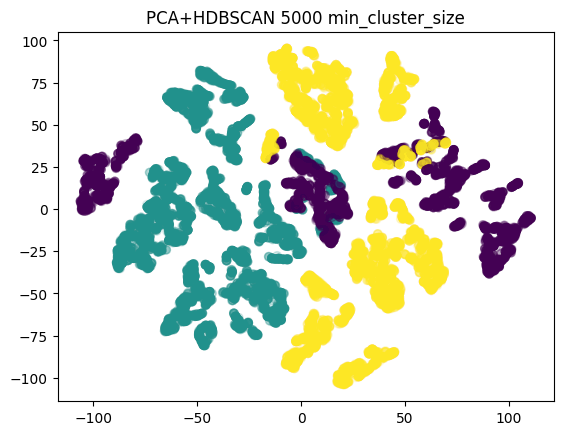

In [47]:
hdb = []
mcs = 1000
rez_hdb = {-1:[],0:[],1:[],2:[]}
while mcs <= 5000:
    hdb.append((mcs,HDBSCAN(min_cluster_size=mcs)))
    mcs+=500

print("HDBSCAN")
for (i,k) in hdb:
    clusters = k.fit_predict(red_data)
    if i==3500:
        for c in range(len(clusters)):
            rez_hdb[clusters[c]].append(applications.iloc[c]['ID'])
    print(clusters.max()+1)
    plot_clusters(r_T[0],r_T[1],clusters,"PCA+HDBSCAN "+str(i)+" min_cluster_size")

In [48]:
for i in rez_hdb.keys():
    for j in range(len(rez_hdb[i])):
        id = rez_hdb[i][j]
        rez_hdb[i][j] = id_to_balance[id]

# Interpretacija rezultata

In [49]:
# Pravi histogram srednjih vrednosti kasnjenja placanja korisnika - zelimo da tezi sto manjoj vrednosti (-2 ili -1)
def draw_results_mean(data):
    for j in data.keys():
        test = []
        for i in range(len(data[j])):
            test.append(np.mean(data[j][i]))
        plt.hist(test, weights=np.ones(len(test)) / len(test))
        plt.axvline(0, color='k', linestyle='dashed', linewidth=1)
        plt.axvline(-1, color='k', linestyle='dashed', linewidth=1)
        plt.axvline(-2, color='k', linestyle='dashed', linewidth=1)
        plt.legend([j])
        plt.show()
# Za svakog korisnika uzima maksimum kao njegovo dugovanje, gleda najgori slucaj
def draw_results_max(data):
    for j in data.keys():
        test = []
        for i in range(len(data[j])):
            test.append(np.max(data[j][i]))
        values, counts = np.unique(test, return_counts=True)
        plt.plot(values, counts)
    plt.legend(data.keys())
    plt.show()
# Za svakog korisnika uzima maksimum kao njegovo dugovanje, gleda najgori slucaj
def draw_results_latest(data):
    for j in data.keys():
        test = []
        for i in range(len(data[j])):
            test.append(data[j][i][0])
        values, counts = np.unique(test, return_counts=True)
        plt.plot(values, counts)
    plt.legend(data.keys())
    plt.show()

def draw_results_length(data):
    for j in data.keys():
        test = []
        for i in range(len(data[j])):
            test.append(len(data[j][i]))
        values, counts = np.unique(test, return_counts=True)
        plt.plot(values, counts)
    plt.legend(data.keys())
    plt.show()

## KMeans

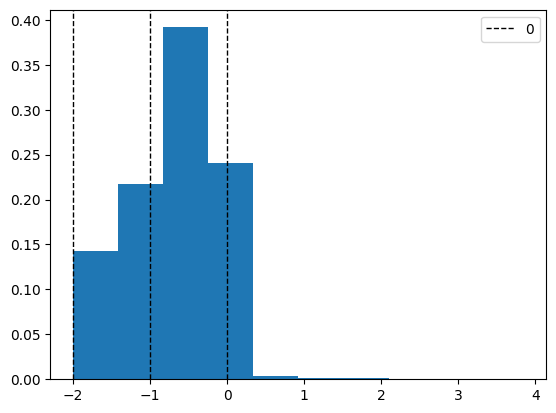

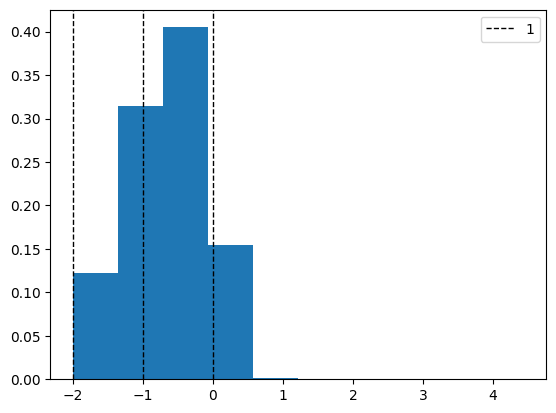

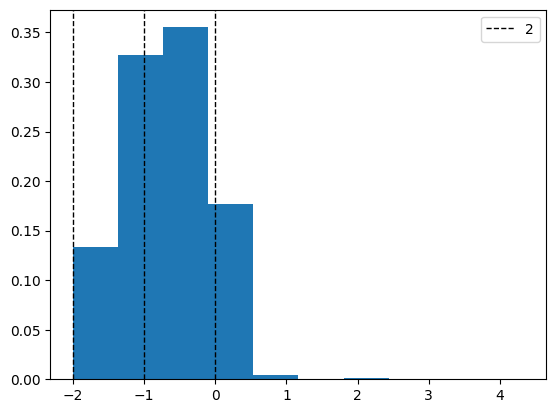

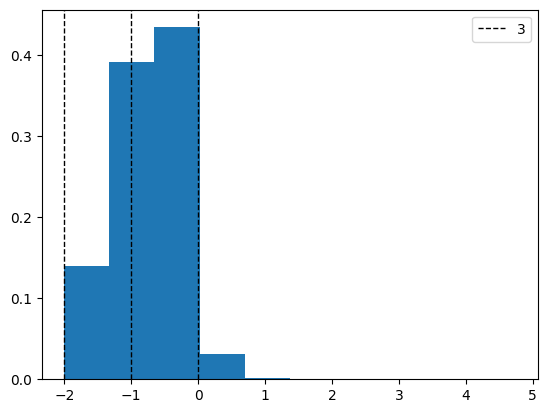

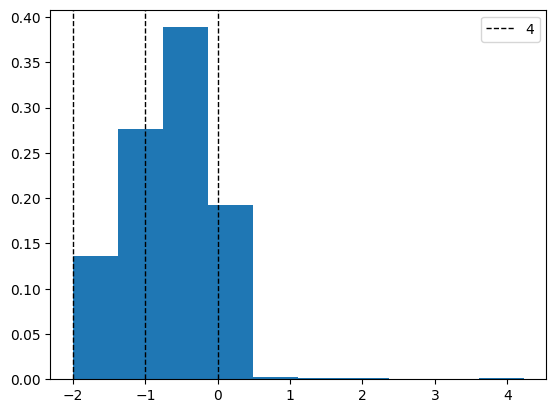

In [50]:
draw_results_mean(rez_km)

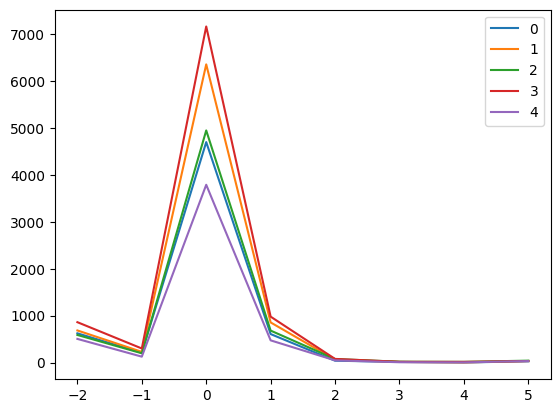

In [51]:
draw_results_max(rez_km)

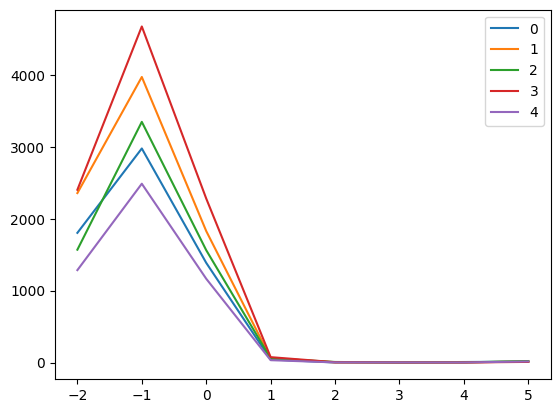

In [52]:
draw_results_latest(rez_km)

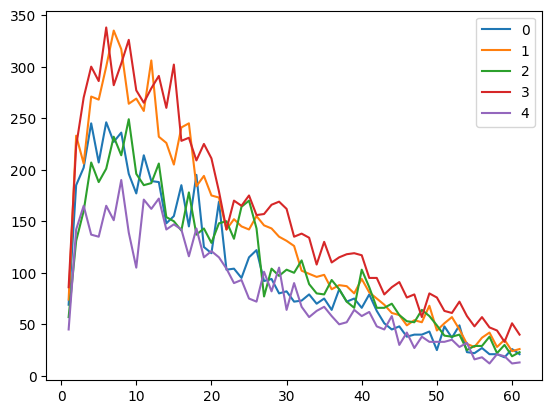

In [53]:
draw_results_length(rez_km)

## Agglomerative Clustering

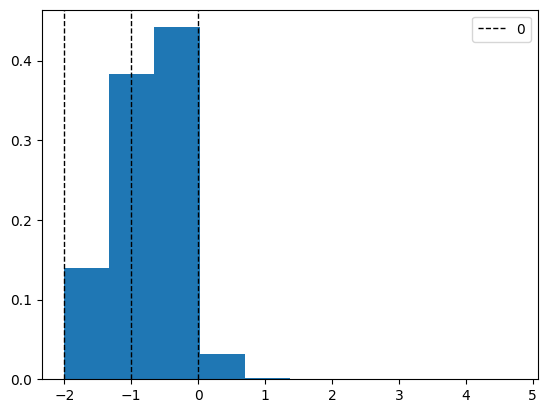

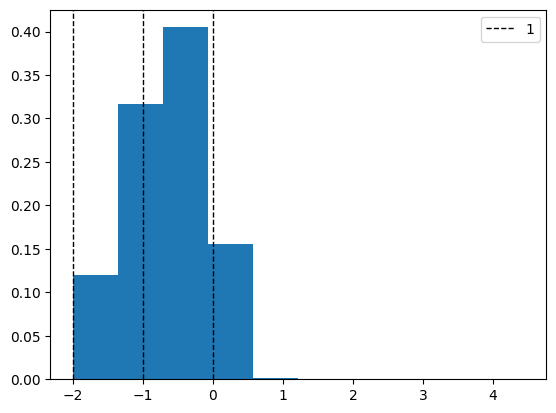

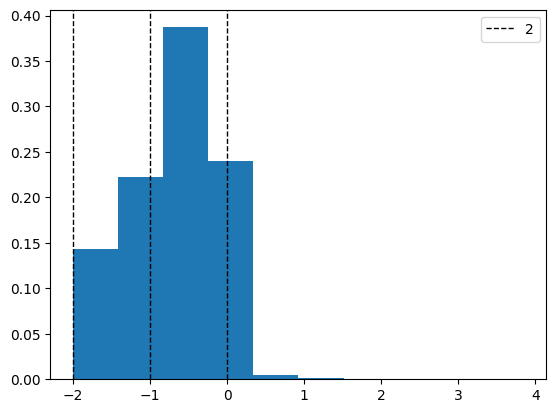

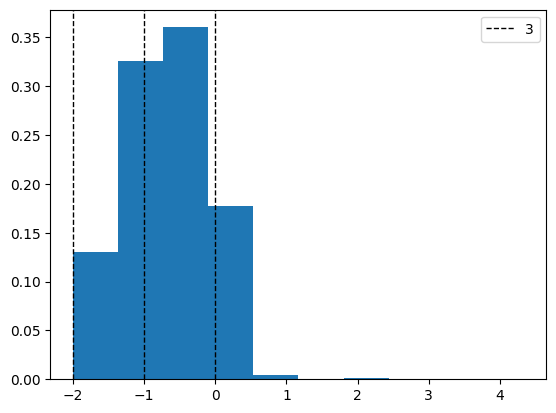

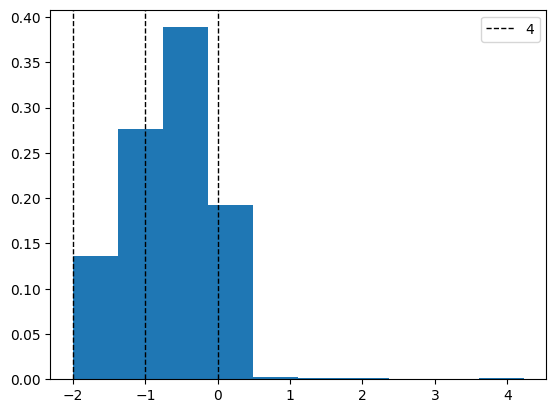

In [54]:
draw_results_mean(rez_ag)

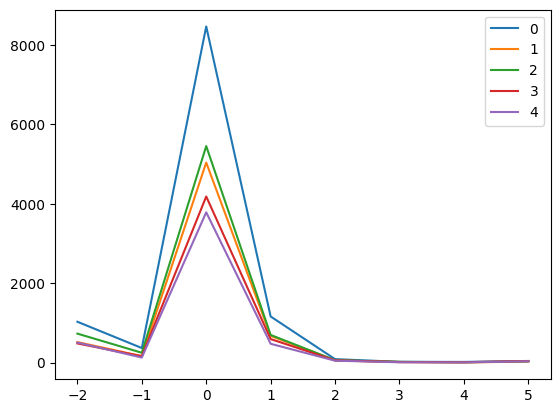

In [55]:
draw_results_max(rez_ag)

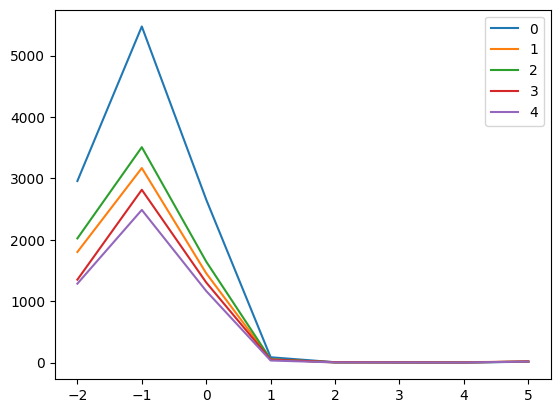

In [56]:
draw_results_latest(rez_ag)

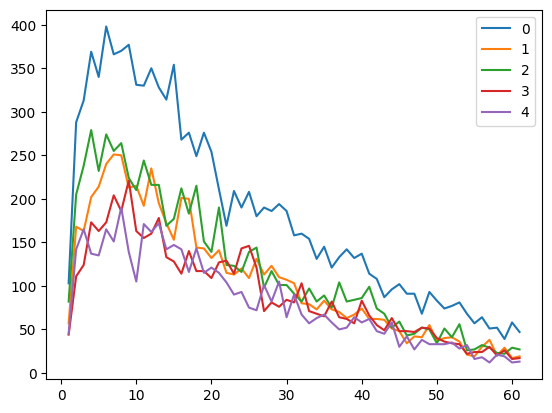

In [57]:
draw_results_length(rez_ag)

## HDBSCAN

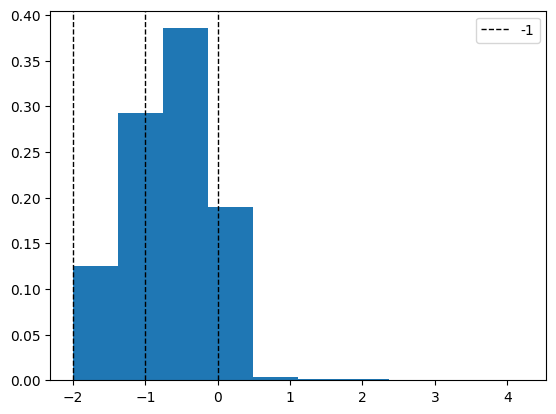

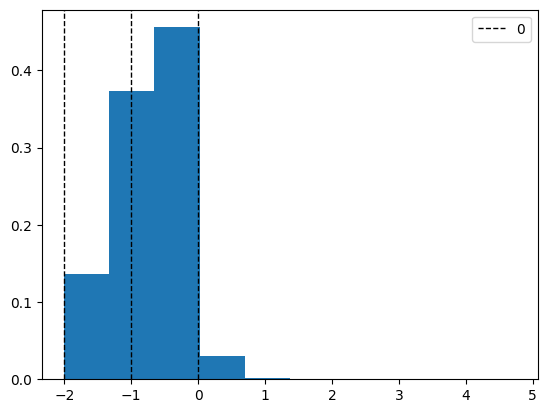

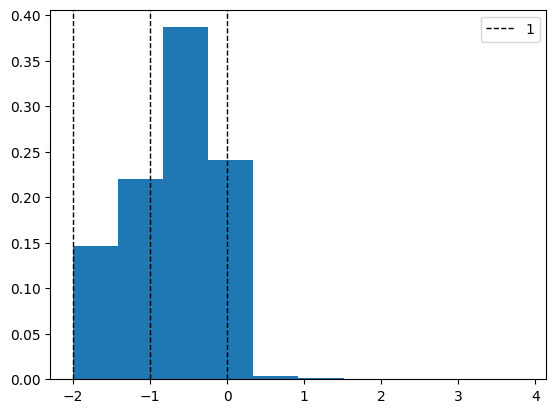

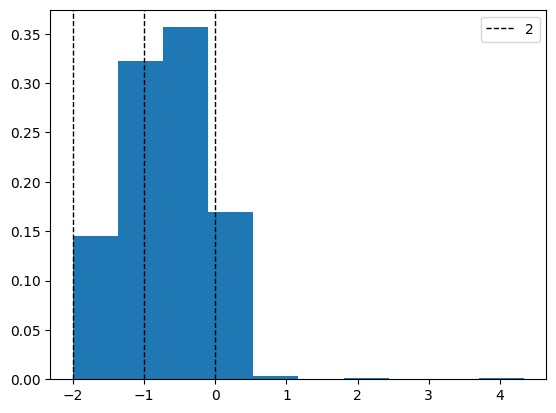

In [58]:
draw_results_mean(rez_hdb)

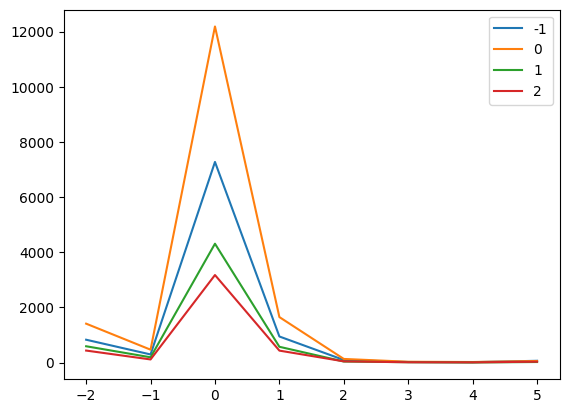

In [59]:
draw_results_max(rez_hdb)

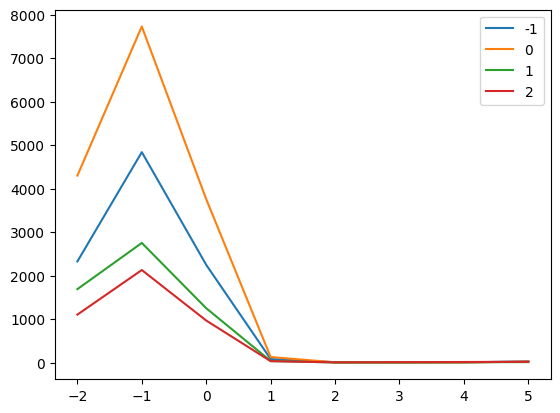

In [60]:
draw_results_latest(rez_hdb)

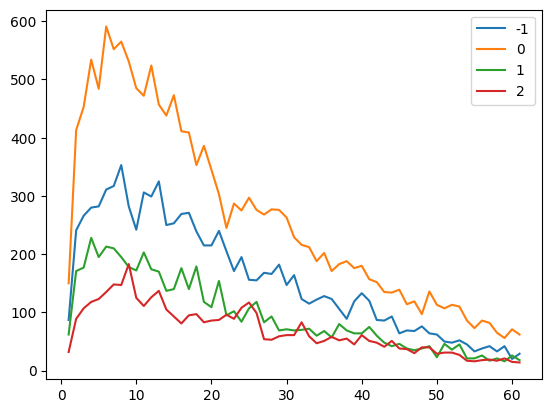

In [61]:
draw_results_length(rez_hdb)